<a href="https://colab.research.google.com/github/ravi-0309/Optimisation-Techniques/blob/main/Optimization_using_Genetic_Algorithm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Number of Bits: 13
Actual Error: 0.00012208521548040532

Generation: 1
global_best_values: [0.9058723  0.69674032 0.50335734 0.68477597 0.71700647 0.91832499
 0.92674887 0.28958613 0.52911732 0.46929557 0.86595043 0.73397632
 0.27432548 0.93834697 0.65669637 0.0908314  0.85532902 0.12367232
 0.0842388  0.85337566 0.26126236 0.34232694 0.64949335 0.7522891
 0.64644122 0.44561104 0.63545355 0.15663533 0.62776218 0.16823343
 0.97497253 0.82468563 0.57782932 0.62116958 0.42107191 0.58002686
 0.02649249 0.17873276 0.41728727 0.81357588 0.58845074 0.38847516
 0.00879014 0.40581126 0.80405323 0.40361372 0.79819314 0.39836406
 0.39848614 0.20144061]

Generation: 2
global_best_values: [0.89952387 0.69686241 0.9058723  0.69674032 0.50335734 0.50958369
 0.68477597 0.71615187 0.71700647 0.91820291 0.91832499 0.71981443
 0.51874008 0.48235869 0.72311073 0.4797949  0.92674887 0.28958613
 0.52887315 0.52911732 0.27981931 0.46929557 0.86595043 0.73397632
 0.73702845 0.27432548 0.93834697 0.94030033 0.

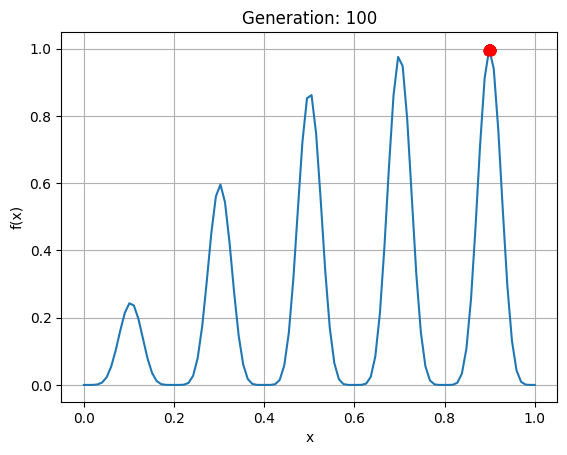

In [6]:
# UNIVARIABLE MAXIMIZATION PROBLEM

import math
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Objective Function
def objective(x, dtype = float):
  return 2**(-2*(((x-1)**2)/(0.8))**2) * (np.sin(5*np.pi*x))**6

def random_population_generator(population_size, upper_bound, lower_bound):
  return np.random.uniform(lower_bound, upper_bound, population_size)

# Encoded to Decoded Value converter i.e. binary to x
def decode(binary_list, bits):
  boom = []
  for binary in binary_list:
    num = 0
    for j in range(bits):
      k = binary % 10
      binary = binary // 10
      num += (2**j) * k
    decoded_value = lower_bound + actual_error * num
    boom.append(decoded_value)
  return np.array(boom)

# Decoded to Encoded values converter i.e. x to binary
def encode(x_list, bits):
    num_list = [int((x - lower_bound) / actual_error) for x in x_list]
    binaries = []
    for num in num_list:
        binary_str = bin(num)[2:].zfill(bits)
        binaries.append(int(binary_str))
    return np.array(binaries)

# Preserve best values
def elitism(binaries_1, binaries_2):
  elites = []
  total = np.concatenate((binaries_1, binaries_2))
  total = list(set(total))
  total_decoded = decode(total, bits)
  total_fitness = objective(total_decoded)
  sorted = np.argsort(total_fitness)[::-1]
  for i in range(len(binaries_1)):
    elites.append(total[sorted[i]])
  return elites

# Cross-Over
def cross_over(binaries, population_size, bits):
  index = []
  new_binaries = np.zeros(population_size, dtype=int)
  for i in range(int(population_size / 2)):
    index.append(random.randint(0, bits-1))
  for i in range(len(index)):
    new_binaries[2*i] = 10**index[i] * (binaries[2*i] // 10**index[i]) + (binaries[2*i+1] % 10**index[i])
    new_binaries[2*i+1] = 10**index[i] * (binaries[2*i+1] // 10**index[i]) + (binaries[2*i] % 10**index[i])
  return new_binaries

# Mutation
def mutation(binaries, population_size, bits):
    mutated = []
    for binary in binaries:
        binary_str = str(binary).zfill(bits)
        binary_list = list(binary_str)
        point = random.randint(0, bits - 1)
        binary_list[point] = '1' if binary_list[point] == '0' else '0'
        mutated.append(int(''.join(binary_list)))
    return mutated

# Parameters
upper_bound = 1
lower_bound = 0
population_size = 50
error = 0.0001
generations = 100

b = ((upper_bound - lower_bound) / error) + 1
bits = math.floor(math.log2(b))
actual_error = ((upper_bound - lower_bound) / (2**bits - 1))
print(f"Number of Bits: {bits}")
print(f"Actual Error: {actual_error}")

initial_x = random_population_generator(population_size, upper_bound, lower_bound)
binaries = encode(initial_x, bits) # Initial Population
decoded_values = decode(binaries, bits)
fitness_values = objective(decoded_values)
sorted = np.argsort(fitness_values)[::-1]
global_best_binaries = [binaries[i] for i in sorted]
global_best_x_values = decode(global_best_binaries, bits)
global_best_fitness = [fitness_values[i] for i in sorted]

best_values_x = np.zeros((generations, population_size))
for i in range(generations):
  print(f"\nGeneration: {i+1}")
  decoded_values = decode(binaries, bits)
  fitness_values = objective(decoded_values)
  global_best_binaries = elitism(global_best_binaries, binaries)
  global_best_values = decode(global_best_binaries, bits)
  print(f"global_best_values: {global_best_values}")
  best_values_x[i] = global_best_values

  # Crossover and Mutation
  binaries = cross_over(global_best_binaries, population_size, bits)
  binaries = mutation(binaries, population_size, bits)

# Create a figure and axis
fig, ax = plt.subplots()
x = np.linspace(lower_bound, upper_bound, int(100 * (upper_bound - lower_bound)))
plt.plot(x, objective(x))
plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('Objective Function')
plt.grid(True)
dots, = ax.plot(best_values_x[0], objective(best_values_x[0]), 'ro')

# Function to update the plot
frame = generations
def update(frame):
  dots.set_data(best_values_x[frame], objective(best_values_x[frame]))
  ax.set_title(f'Generation: {frame + 1}')
  return dots,

# Create animation
ani = FuncAnimation(fig, update, frames=generations, interval=50, blit=True)

# Display animation in Colab
HTML(ani.to_jshtml())

In [110]:
# TWO VARIABLE MAXIMIZATION PROBLEM

import math
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Parameters
upper_bound = 5.12
lower_bound = -5.12
population_size = 100
error = 0.001
generations = 100
number_of_variables = 2

b = ((upper_bound - lower_bound) / error) + 1
bits = math.floor(math.log2(b))
actual_error = ((upper_bound - lower_bound) / (2**bits - 1))
print(f"Number of Bits: {bits}")
print(f"Actual Error: {actual_error}")

# Objective Function
def objective(x_list):
  f_values = np.zeros(len(x_list))
  for i, (x, y) in enumerate(x_list):
    f_values[i] = -(x**2 + y - 11)**2 - (x + y**2 - 7)**2
  return f_values

# Integer to Binary Converter
def int_to_binary(n, bits):
  binary_str = bin(n)[2:].zfill(bits)
  return int(binary_str)

# Binary to Integer Converter
def binary_to_int(binary_number):
  return int(str(binary_number), 2)

# Random Initial Population Generator
def random_population_generator(population_size, upper_bound, lower_bound):
  rand = np.zeros((population_size, number_of_variables))
  for i in range(population_size):
    for j in range(number_of_variables):
      rand[i][j] = np.random.uniform(lower_bound, upper_bound)
  return rand

# Decoded to Encoded values converter i.e. x to binary
def encode(x_list_array, population_size, bits, dtype=int):
  binaries = np.zeros(population_size * number_of_variables, dtype=int)
  x_list = x_list_array.flatten()
  num_list = [int((x - lower_bound) / actual_error) for x in x_list]
  for i in range(len(num_list)):
    binaries[i] = int_to_binary(num_list[i], bits)
  binaries = binaries.reshape(population_size, number_of_variables)
  return np.array(binaries)

# Encoded to Decoded Value converter i.e. binary to x
def decode(binary_list_array, population_size, bits):
  num_values = np.zeros(population_size * number_of_variables, dtype = int)
  x_values = np.zeros(population_size * number_of_variables)
  binary_list_array = np.array(binary_list_array)
  binary_list = binary_list_array.flatten()
  for i in range(len(binary_list)):
    num_values[i] = binary_to_int(binary_list[i])
    x_values[i] = lower_bound + actual_error * num_values[i]
  x_values = x_values.reshape(population_size, number_of_variables)
  return x_values

# Preserve best values
def elitism(binaries_1, binaries_2):
  binaries_1 = np.array(binaries_1)
  binaries_2 = np.array(binaries_2)
  total = np.vstack((binaries_1, binaries_2))
  total_decoded = decode(total, population_size*2, bits)
  total_fitness = objective(total_decoded)
  sorted = np.argsort(total_fitness)[::-1]
  elites = [total[sorted[i]] for i in range(population_size)]
  return elites

# Cross-Over
def cross_over(binaries, population_size, bits):
  index = []
  new_binaries = np.zeros((population_size, number_of_variables), dtype=int)
  for i in range(int(population_size / 2)):
    index.append(random.randint(0, bits-1))
  for i in range(len(index)):
    for j in range(number_of_variables):
      new_binaries[2*i][j] = 10**index[i] * (binaries[2*i][j] // 10**index[i]) + (binaries[2*i+1][j] % 10**index[i])
      new_binaries[2*i+1][j] = 10**index[i] * (binaries[2*i+1][j] // 10**index[i]) + (binaries[2*i][j] % 10**index[i])
  return new_binaries

# Mutation
def mutation(binaries, population_size, bits):
  mutated = np.zeros((population_size, number_of_variables), dtype=int)
  for i, binary in enumerate(binaries):
    for j in range(number_of_variables):
      binary_str = str(binary[j]).zfill(bits)
      binary_list = list(binary_str)
      point = random.randint(0, bits - 1)
      binary_list[point] = '1' if binary_list[point] == '0' else '0'
      mutated[i][j] = int(''.join(binary_list))
  return mutated

# Main GA Loop
initial_x = random_population_generator(population_size, upper_bound, lower_bound)
binaries = encode(initial_x, population_size, bits) # Initial Population
decoded_values = decode(binaries, population_size, bits)
fitness_values = objective(decoded_values)

sorted = np.argsort(fitness_values)[::-1]
global_best_binaries = [binaries[i] for i in sorted]
global_best_x_values = decode(global_best_binaries, population_size, bits)
global_best_fitness = [fitness_values[i] for i in sorted]


best_values_x = np.zeros((generations, population_size, number_of_variables))
for i in range(generations):
  print(f"\nGeneration: {i+1}")
  decoded_values = decode(binaries, population_size, bits)
  fitness_values = objective(decoded_values)
  global_best_binaries = elitism(global_best_binaries, binaries)
  global_best_values = decode(global_best_binaries, population_size, bits)
  print(f"global_best_values: {global_best_values}")
  best_values_x[i] = global_best_values

  # Crossover and Mutation
  binaries = cross_over(global_best_binaries, population_size, bits)
  binaries = mutation(binaries, population_size, bits)

# Final Animation
# Create grid points
x_1 = np.linspace(lower_bound, upper_bound, int(100 * (upper_bound - lower_bound)))
x_2 = np.linspace(lower_bound, upper_bound, int(100 * (upper_bound - lower_bound)))
X, Y = np.meshgrid(x_1, x_2)

xy_pairs = np.c_[X.ravel(), Y.ravel()]

Z = objective(xy_pairs).reshape(X.shape)

# Then modify your animation code:
fig, ax = plt.subplots(figsize=(8, 6))
contour = ax.contourf(X, Y, Z, levels=30, cmap='viridis')
plt.colorbar(contour, label = 'Fitness')
scatter = ax.scatter([], [], color='red', s=50, edgecolor='black', label='Population')
ax.set_xlim(lower_bound, upper_bound)
ax.set_ylim(lower_bound, upper_bound)
ax.set_xlabel("x1")
ax.set_ylabel("x2")
ax.set_title("Genetic Algorithm Optimization")
ax.grid(True)
ax.legend()

def init():
    scatter.set_offsets(np.empty((0, 2)))
    return scatter,

def update(frame):
    points = best_values_x[frame]
    scatter.set_offsets(points)
    ax.set_title(f"Generation {frame+1}")
    return scatter,

# Create animation
anim = FuncAnimation(
    fig,
    update,
    frames = generations,
    init_func = init,
    blit=True,
    interval=200,
    repeat=False
)

plt.close()
HTML(anim.to_jshtml())

Streaming output truncated to the last 5000 lines.
 [3.00599194 2.01087047]
 [3.01224271 1.99336833]]

Generation: 52
global_best_values: [[2.99974118 2.00086925]
 [3.00099133 2.00086925]
 [3.00099133 1.99711879]
 [3.00224148 2.00086925]
 [2.99724087 2.0021194 ]
 [3.00099133 1.99586864]
 [2.99724087 1.99961909]
 [2.99849103 2.0046197 ]
 [3.00349164 1.99836894]
 [3.00349164 1.99836894]
 [2.99724087 2.0046197 ]
 [3.00349164 1.99711879]
 [3.00099133 2.0046197 ]
 [3.00099133 2.0046197 ]
 [2.99599072 2.00336955]
 [2.99599072 1.99961909]
 [2.99599072 1.99961909]
 [3.00349164 2.0021194 ]
 [3.00474179 1.99711879]
 [2.99849103 2.00712001]
 [2.99599072 1.99836894]
 [3.00474179 1.99961909]
 [3.00474179 1.99961909]
 [2.99599072 2.00712001]
 [3.00599194 1.99711879]
 [3.00474179 1.99211818]
 [2.99349042 2.0021194 ]
 [2.99349042 2.00586986]
 [3.00599194 1.99211818]
 [2.99349042 2.00086925]
 [2.99974118 2.00962031]
 [3.00474179 2.0046197 ]
 [3.00349164 2.00712001]
 [3.00724209 1.99211818]
 [2.99474057

In [91]:
# THREE VARIABLE MAXIMIZATION PROBLEM

import math
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Parameters
upper_bound = 2
lower_bound = -2
population_size = 40
error = 0.001
generations = 100
number_of_variables = 3

b = ((upper_bound - lower_bound) / error) + 1
bits = math.floor(math.log2(b))
actual_error = ((upper_bound - lower_bound) / (2**bits - 1))
print(f"Number of Bits: {bits}")
print(f"Actual Error: {actual_error}")

# Objective
def objective(x_list):
    f_values = np.zeros(len(x_list))
    for i, x in enumerate(x_list):
        f_values[i] = (
            np.sin(x[0]) * np.cos(x[1]) * np.sin(x[2])
            + x[0]**2 - x[1]**2
            + np.log(1 + x[2]**2)
            + 0.3 * x[0] * x[1]
            - 0.5 * x[1] * x[2]
        )
    return f_values

# Integer to Binary Converter
def int_to_binary(n, bits):
  binary_str = bin(n)[2:].zfill(bits)
  return int(binary_str)

# Binary to Integer Converter
def binary_to_int(binary_number):
  return int(str(binary_number), 2)

# Random Initial Population Generator
def random_population_generator(population_size, upper_bound, lower_bound):
  rand = np.zeros((population_size, number_of_variables))
  for i in range(population_size):
    for j in range(number_of_variables):
      rand[i][j] = np.random.uniform(lower_bound, upper_bound)
  return rand

# Decoded to Encoded values converter i.e. x to binary
def encode(x_list_array, population_size, bits, dtype=int):
  binaries = np.zeros(population_size * number_of_variables, dtype=int)
  x_list = x_list_array.flatten()
  num_list = [int((x - lower_bound) / actual_error) for x in x_list]
  for i in range(len(num_list)):
    binaries[i] = int_to_binary(num_list[i], bits)
  binaries = binaries.reshape(population_size, number_of_variables)
  return np.array(binaries)

# Encoded to Decoded Value converter i.e. binary to x
def decode(binary_list_array, population_size, bits):
  num_values = np.zeros(population_size * number_of_variables, dtype = int)
  x_values = np.zeros(population_size * number_of_variables)
  binary_list_array = np.array(binary_list_array)
  binary_list = binary_list_array.flatten()
  for i in range(len(binary_list)):
    num_values[i] = binary_to_int(binary_list[i])
    x_values[i] = lower_bound + actual_error * num_values[i]
  x_values = x_values.reshape(population_size, number_of_variables)
  return x_values

# Preserve best values
def elitism(binaries_1, binaries_2):
  binaries_1 = np.array(binaries_1)
  binaries_2 = np.array(binaries_2)
  total = np.vstack((binaries_1, binaries_2))
  total_decoded = decode(total, population_size*2, bits)
  total_fitness = objective(total_decoded)
  sorted = np.argsort(total_fitness)[::-1]
  elites = [total[sorted[i]] for i in range(population_size)]
  return elites

# Cross-Over
def cross_over(binaries, population_size, bits):
  index = []
  new_binaries = np.zeros((population_size, number_of_variables), dtype=int)
  for i in range(int(population_size / 2)):
    index.append(random.randint(0, bits-1))
  for i in range(len(index)):
    for j in range(number_of_variables):
      new_binaries[2*i][j] = 10**index[i] * (binaries[2*i][j] // 10**index[i]) + (binaries[2*i+1][j] % 10**index[i])
      new_binaries[2*i+1][j] = 10**index[i] * (binaries[2*i+1][j] // 10**index[i]) + (binaries[2*i][j] % 10**index[i])
  return new_binaries

# Mutation
def mutation(binaries, population_size, bits):
  mutated = np.zeros((population_size, number_of_variables), dtype=int)
  for i, binary in enumerate(binaries):
    for j in range(number_of_variables):
      binary_str = str(binary[j]).zfill(bits)
      binary_list = list(binary_str)
      point = random.randint(0, bits - 1)
      binary_list[point] = '1' if binary_list[point] == '0' else '0'
      mutated[i][j] = int(''.join(binary_list))
  return mutated

# Main GA Loop
initial_x = random_population_generator(population_size, upper_bound, lower_bound)
binaries = encode(initial_x, population_size, bits) # Initial Population
decoded_values = decode(binaries, population_size, bits)
fitness_values = objective(decoded_values)

sorted = np.argsort(fitness_values)[::-1]
global_best_binaries = [binaries[i] for i in sorted]
global_best_x_values = decode(global_best_binaries, population_size, bits)
global_best_fitness = [fitness_values[i] for i in sorted]


best_values_x = np.zeros((generations, population_size, number_of_variables))
for i in range(generations):
  print(f"\nGeneration: {i+1}")
  decoded_values = decode(binaries, population_size, bits)
  fitness_values = objective(decoded_values)
  global_best_binaries = elitism(global_best_binaries, binaries)
  global_best_values = decode(global_best_binaries, population_size, bits)
  print(f"global_best_values: {global_best_values}")
  best_values_x[i] = global_best_values

  # Crossover and Mutation
  binaries = cross_over(global_best_binaries, population_size, bits)
  binaries = mutation(binaries, population_size, bits)



Number of Bits: 11
Actual Error: 0.0019540791402051783

Generation: 1
global_best_values: [[-1.78309722  0.82364436 -1.98241329]
 [-1.78309722  0.82364436 -1.98241329]
 [-1.99609184 -0.70444553  1.41182218]
 [-1.99609184 -0.70444553  1.41182218]
 [ 1.68539326  0.77674646 -1.59550562]
 [ 1.68539326  0.77674646 -1.59550562]
 [-1.97655105  0.33512457  1.67757694]
 [-1.97655105  0.33512457  1.67757694]
 [ 1.96091842  1.15388373  0.8197362 ]
 [ 1.96091842  1.15388373  0.8197362 ]
 [-1.39423547  1.38837323 -1.70493405]
 [-1.39423547  1.38837323 -1.70493405]
 [-1.19101124 -0.84123107 -1.4098681 ]
 [-1.19101124 -0.84123107 -1.4098681 ]
 [-1.34342941  0.15534929  1.58378114]
 [-1.34342941  0.15534929  1.58378114]
 [ 1.38055691  0.65559355 -0.71030777]
 [ 1.38055691  0.65559355 -0.71030777]
 [-1.31411822 -0.18075232  0.04982902]
 [-1.31411822 -0.18075232  0.04982902]
 [-1.185149    0.92721055 -0.86272594]
 [-1.185149    0.92721055 -0.86272594]
 [-1.23595506 -0.35271128  0.26282364]
 [-1.23595506

Number of Bits: 13
Actual Error: 0.00012208521548040532

Generation: 1
global_best_values: [0.30313759 0.47820779 0.29801001 0.29544622 0.52691979 0.28580149
 0.46538884 0.33256013 0.11793432 0.12648028 0.3418386  0.13038701
 0.13282871 0.07251862 0.13978757 0.55866195 0.05432792 0.56244659
 0.43120498 0.23074106 0.02783543 0.22219509 0.02551581 0.58491027
 0.58600903 0.41350262 0.21364913 0.01587108 0.00219753 0.61714076
 0.63545355 0.6399707  0.64595288 0.71578562 0.72652912 0.7522891
 0.75827127 0.78451959 0.79965816 0.80466366 0.80600659 0.82639482
 0.83762666 0.84080088 0.85996826 0.91063362 0.91893542 0.94762544
 0.96007813 0.99902332]

Generation: 2
global_best_values: [0.30240508 0.30313759 0.47820779 0.29801001 0.2964229  0.29544622
 0.52691979 0.28580149 0.32035161 0.46538884 0.33256013 0.33268221
 0.46148211 0.2667562  0.11793432 0.33866439 0.08484922 0.12489318
 0.12648028 0.3418386  0.34196069 0.54633134 0.13038701 0.13282871
 0.25808815 0.5491393  0.13514833 0.07251862 0.

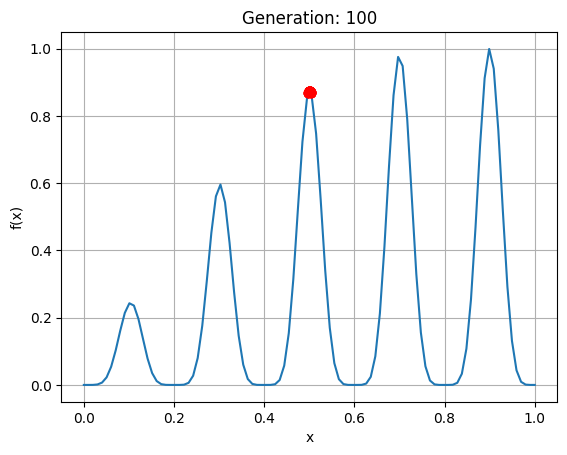

In [147]:
# UNIVARIABLE MAXIMIZATION PROBLEM

import math
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

R = 1000
# Objective Function
def objective(x, dtype = float):
  return 2**(-2*(((x-1)**2)/(0.8))**2) * (np.sin(5*np.pi*x))**6 - R*(np.minimum(0.6 - x, 0))**2

def plotting_values(x):
  return 2**(-2*(((x-1)**2)/(0.8))**2) * (np.sin(5*np.pi*x))**6

def random_population_generator(population_size, upper_bound, lower_bound):
  return np.random.uniform(lower_bound, upper_bound, population_size)

# Encoded to Decoded Value converter i.e. binary to x
def decode(binary_list, bits):
  boom = []
  for binary in binary_list:
    num = 0
    for j in range(bits):
      k = binary % 10
      binary = binary // 10
      num += (2**j) * k
    decoded_value = lower_bound + actual_error * num
    boom.append(decoded_value)
  return np.array(boom)

# Decoded to Encoded values converter i.e. x to binary
def encode(x_list, bits):
    num_list = [int((x - lower_bound) / actual_error) for x in x_list]
    binaries = []
    for num in num_list:
        binary_str = bin(num)[2:].zfill(bits)
        binaries.append(int(binary_str))
    return np.array(binaries)

# Preserve best values
def elitism(binaries_1, binaries_2):
  elites = []
  total = np.concatenate((binaries_1, binaries_2))
  total = list(set(total))
  total_decoded = decode(total, bits)
  total_fitness = objective(total_decoded)
  sorted = np.argsort(total_fitness)[::-1]
  for i in range(len(binaries_1)):
    elites.append(total[sorted[i]])
  return elites

# Cross-Over
def cross_over(binaries, population_size, bits):
  index = []
  new_binaries = np.zeros(population_size, dtype=int)
  for i in range(int(population_size / 2)):
    index.append(random.randint(0, bits-1))
  for i in range(len(index)):
    new_binaries[2*i] = 10**index[i] * (binaries[2*i] // 10**index[i]) + (binaries[2*i+1] % 10**index[i])
    new_binaries[2*i+1] = 10**index[i] * (binaries[2*i+1] // 10**index[i]) + (binaries[2*i] % 10**index[i])
  return new_binaries

# Mutation
def mutation(binaries, population_size, bits):
    mutated = []
    for binary in binaries:
        binary_str = str(binary).zfill(bits)
        binary_list = list(binary_str)
        point = random.randint(0, bits - 1)
        binary_list[point] = '1' if binary_list[point] == '0' else '0'
        mutated.append(int(''.join(binary_list)))
    return mutated

# Parameters
upper_bound = 1
lower_bound = 0
population_size = 50
error = 0.0001
generations = 100

b = ((upper_bound - lower_bound) / error) + 1
bits = math.floor(math.log2(b))
actual_error = ((upper_bound - lower_bound) / (2**bits - 1))
print(f"Number of Bits: {bits}")
print(f"Actual Error: {actual_error}")

initial_x = random_population_generator(population_size, upper_bound, lower_bound)
binaries = encode(initial_x, bits) # Initial Population
decoded_values = decode(binaries, bits)
fitness_values = objective(decoded_values)
sorted = np.argsort(fitness_values)[::-1]
global_best_binaries = [binaries[i] for i in sorted]
global_best_x_values = decode(global_best_binaries, bits)
global_best_fitness = [fitness_values[i] for i in sorted]

best_values_x = np.zeros((generations, population_size))
for i in range(generations):
  print(f"\nGeneration: {i+1}")
  decoded_values = decode(binaries, bits)
  fitness_values = objective(decoded_values)
  global_best_binaries = elitism(global_best_binaries, binaries)
  global_best_values = decode(global_best_binaries, bits)
  print(f"global_best_values: {global_best_values}")
  best_values_x[i] = global_best_values

  # Crossover and Mutation
  binaries = cross_over(global_best_binaries, population_size, bits)
  binaries = mutation(binaries, population_size, bits)

# Create a figure and axis
fig, ax = plt.subplots()
x = np.linspace(lower_bound, upper_bound, int(100 * (upper_bound - lower_bound)))
plt.plot(x, plotting_values(x))
plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('Objective Function')
plt.grid(True)
dots, = ax.plot(best_values_x[0], plotting_values(best_values_x[0]), 'ro')

# Function to update the plot
frame = generations
def update(frame):
  dots.set_data(best_values_x[frame], plotting_values(best_values_x[frame]))
  ax.set_title(f'Generation: {frame + 1}')
  return dots,

# Create animation
ani = FuncAnimation(fig, update, frames=generations, interval=50, blit=True)

# Display animation in Colab
HTML(ani.to_jshtml())